In [2]:
conda install notebook

Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install -U scvelo

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install python-igraph louvain


Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install pybind11 hnswlib


Note: you may need to restart the kernel to use updated packages.


In [6]:
import scvelo as scv
import scanpy as sc
import numpy as np 

In [8]:
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.6.12) on 2021-09-03 11:27.


In [9]:
scv.settings.verbosity = 3  
scv.settings.presenter_view = True 
scv.set_figure_params('scvelo') 

# Milestone 1: Read into AnnData object

### 1.1. Read the pancreas dataset

In [10]:
adata = scv.datasets.pancreas()
adata

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

### 1.2. Why do we use an AnnData object?

AnnData: It is a structured data format used in Scanpy analysis pipeline to store both data, and associated metadata from genes and cells.

### 1.3. Where are the un/spliced counts and annotations for observations and variables stored?


![](https://falexwolf.de/img/scanpy/anndata.svg)

In [13]:
adata.layers["spliced"]

<3696x27998 sparse matrix of type '<class 'numpy.float32'>'
	with 9298890 stored elements in Compressed Sparse Row format>

In [ ]:
adata.layers["unspliced"]

In [ ]:
adata.X.A
adata.obs

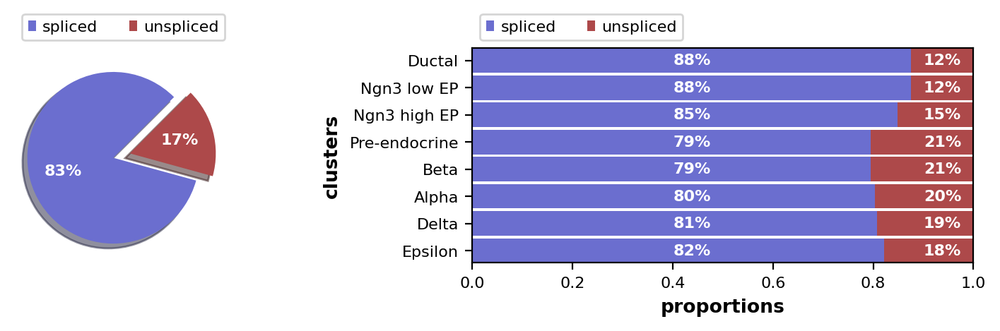

In [11]:
scv.pl.proportions(adata)

### 1.4. Describe in form of text the rational for these steps in your markdown report.

# Milestone 2: Preprocessing

### 2.1 Why do we need to filter out a number of genes?

- Raw count matrices often include over 20,000 genes. This number can be drastically reduced
    by filtering out genes that are not expressed in more than a few cells and are thus not informative of the cellular heterogeneity.
    A guideline to setting this threshold is to use the minimum cell cluster size that is of interest and leaving some leeway for dropout effects. 

    For example, filtering out genes expressed in fewer than 20 cells may make it difficult to detect cell clusters with fewer than 20 cells. 
    For datasets with high dropout rates, this threshold may also complicate the detection of larger clusters. 
    
    The choice of threshold should scale with the number of cells in the dataset and the intended downstream analysis.
    _Luecken and Theis (2019), Current best practices in single-cell RNA-seq analysis: a tutorial_

### 2.2 What are meaningful gene selection criteria and why?

- Highly variable genes are the ones that best describe the data.

### 2.3 What is the rationale of normalizing the counts?

- "Each count in a count matrix represents the successful capture, reverse transcription and sequencing of a molecule of cellular mRNA Count depths for identical cells can differ due to the
variability inherent in each of these steps. Thus, when gene expression
is compared between cells based on count data, any difference
may have arisen solely due to sampling effects. Normalization
addresses this issue by e.g. scaling count data to obtain correct relative
gene expression abundances between cells." _Luecken and Theis (2019), Current best practices in single-cell RNA-seq analysis: a tutorial_

### 2.4 After gene selection and normalization the data is log-transformed. What is it necessary for?

- "After normalization, data matrices are typically log(x+1)-transformed.
This transformation has three important effects. Firstly,
distances between log-transformed expression values represent log
fold changes, which are the canonical way to measure changes in
expression. Secondly, log transformation mitigates (but does not
remove) the mean–variance relationship in single-cell data (Brennecke
et al, 2013). Finally, log transformation reduces the skewness
of the data to approximate the assumption of many
downstream analysis tools that the data are normally distributed." _Luecken and Theis (2019), Current best practices in single-cell RNA-seq analysis: a tutorial_

### 2.5. Show how the PCA embeddings compare when you use log vs. non-log data.


In [15]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata)
scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
scv.pp.pca(adata)

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


# Non-logged

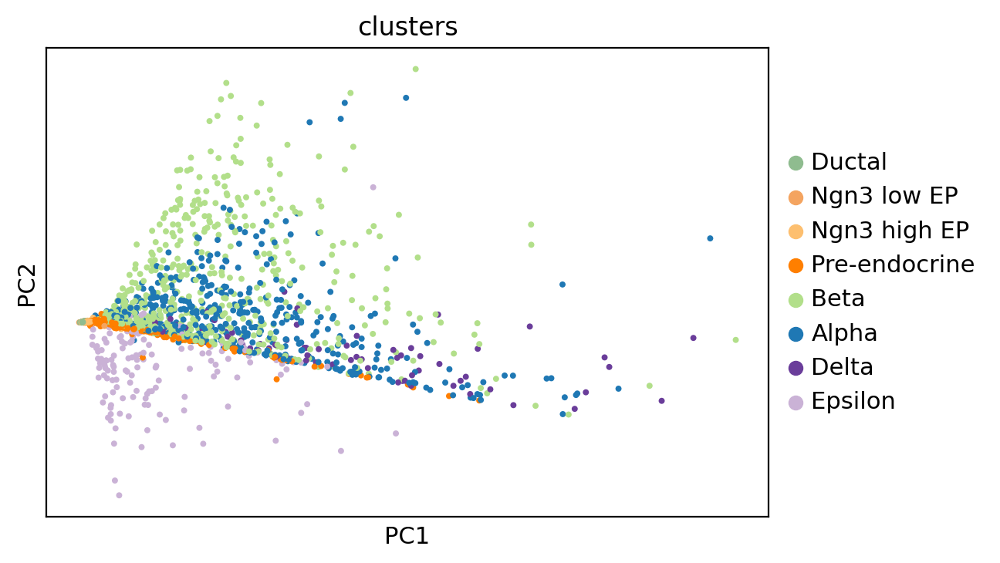

In [16]:
sc.pl.pca(adata, color = "clusters")

# Logged

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


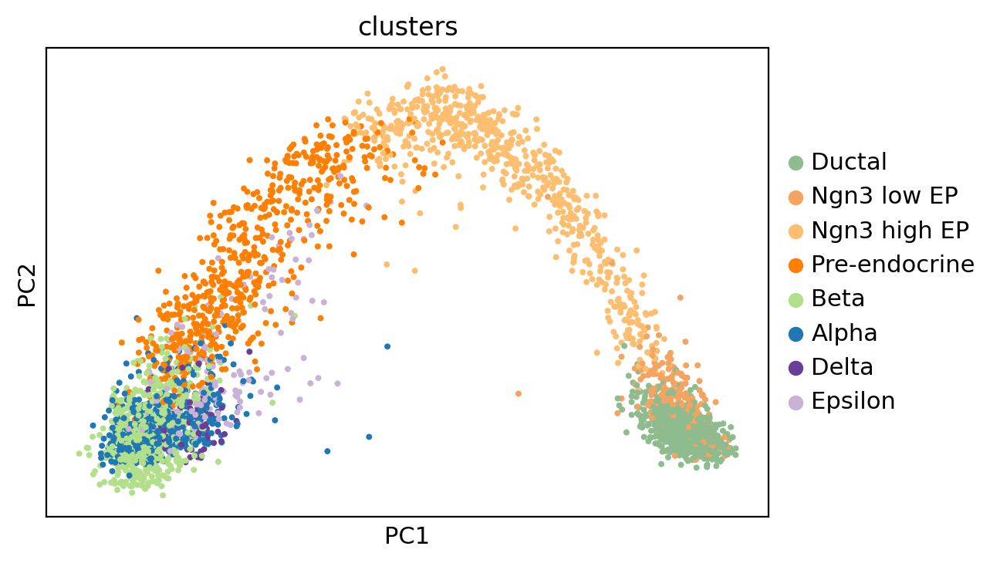

In [17]:
adata1 = scv.datasets.pancreas()
scv.pp.filter_genes(adata1, min_shared_counts=20)
scv.pp.normalize_per_cell(adata1)
scv.pp.filter_genes_dispersion(adata1, n_top_genes=2000)
scv.pp.log1p(adata1)
scv.pp.pca(adata1)
sc.pl.pca(adata1, color = "clusters")

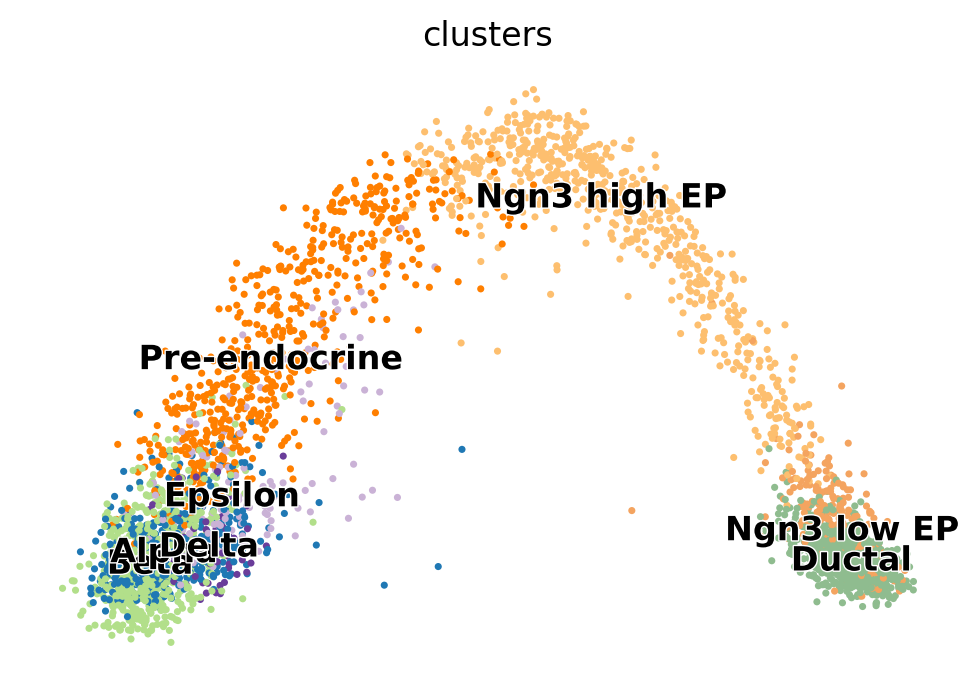

In [18]:
scv.plotting.pca(adata1)

# Milestone3: : Neighbor graph, and moments 

### 3.1.
The PCA representation (computed on the log-normalized data) is used to compute a neighbor graph from cell-to-cell distances. What does this graph represent and what can it be used for?

### 3.2.
Now, we use the graph to compute first-order moments, i.e., for each cell, the mean (first-order moments) and variance (second-order moments) of its neighboring cells is computed. This can also be regarded as a knn-imputation of the counts.

### 3.3. 
Show how the k parameter (number of neighbors) impacts the imputed counts, e.g., by comparing the imputed gene expression of two genes with different values for k.

The kNN graph helps to connect the neighboring cells and then it can be used to compute clusters. 


In [19]:
scv.pp.moments(adata1, n_pcs=30, n_neighbors=20)

computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [20]:
adata1.layers['Mu'][:,1]

array([0.01901493, 0.03790612, 0.        , ..., 0.1387887 , 0.        ,
       0.        ], dtype=float32)

computing neighbors
    finished (0:00:07) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


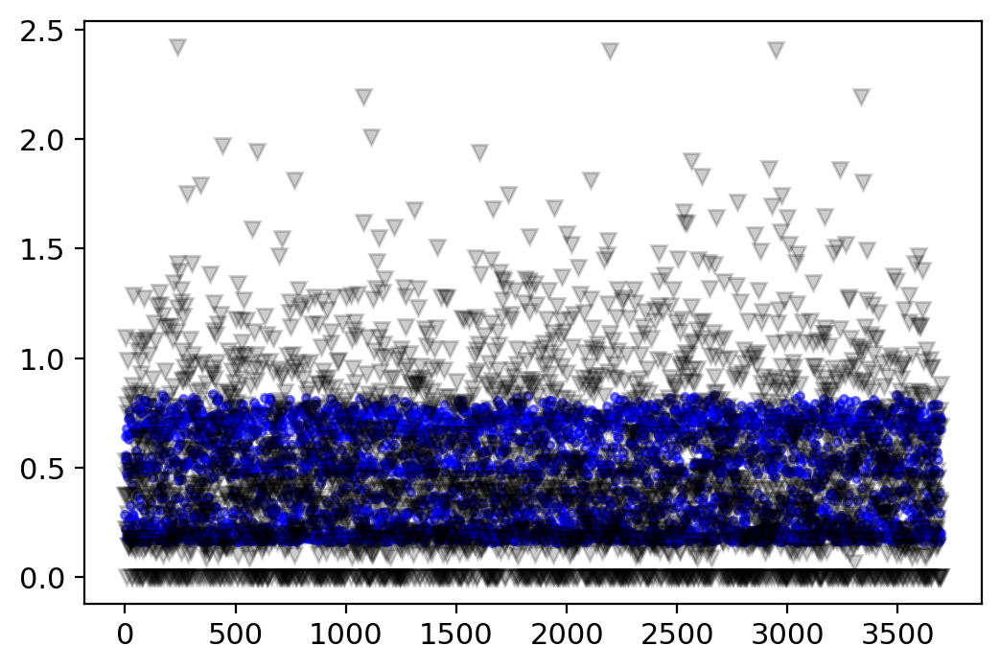

In [21]:
#Impact of k parameter on the imputed counts by comparing the expression of a gene with 2 different k values
scv.pp.moments(adata1, n_neighbors =500)
gene1_50=adata1.layers['Ms'][:,1]

scv.pp.moments(adata1, n_neighbors = 5)
gene1_20=adata1.layers['Ms'][:,1]

import matplotlib.pyplot as plt

p1=plt.plot(gene1_50, '.', color='blue', alpha=0.5)

p2=plt.plot(gene1_20, 'v', color='black', alpha=0.2)


(0.0, 2.5)

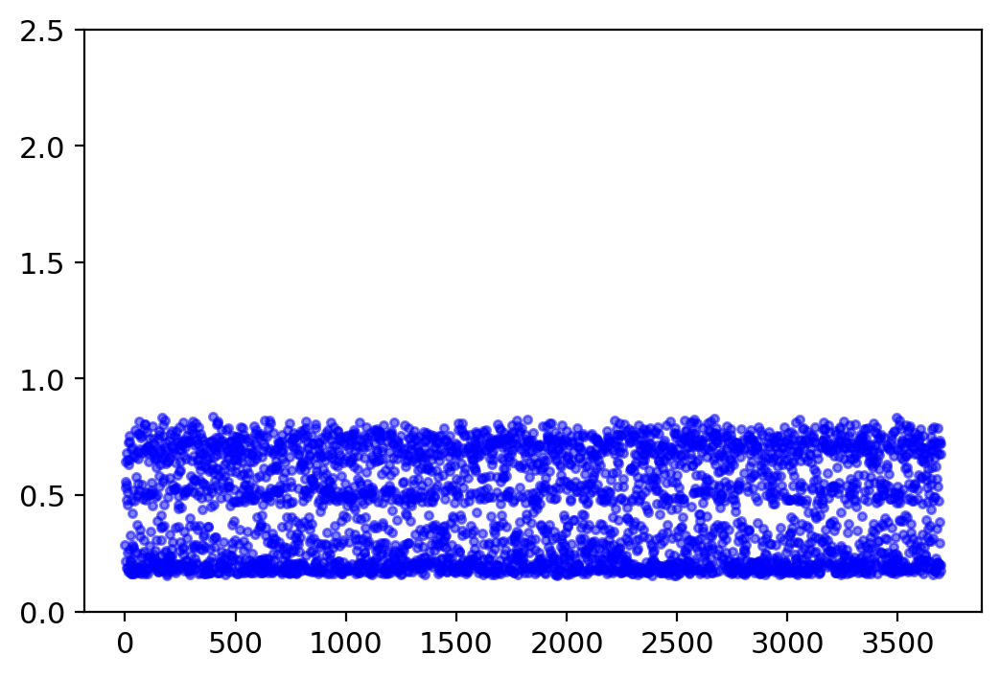

In [22]:
plt.plot(gene1_50, '.', color='blue', alpha=0.5)
plt.ylim((0,2.5))

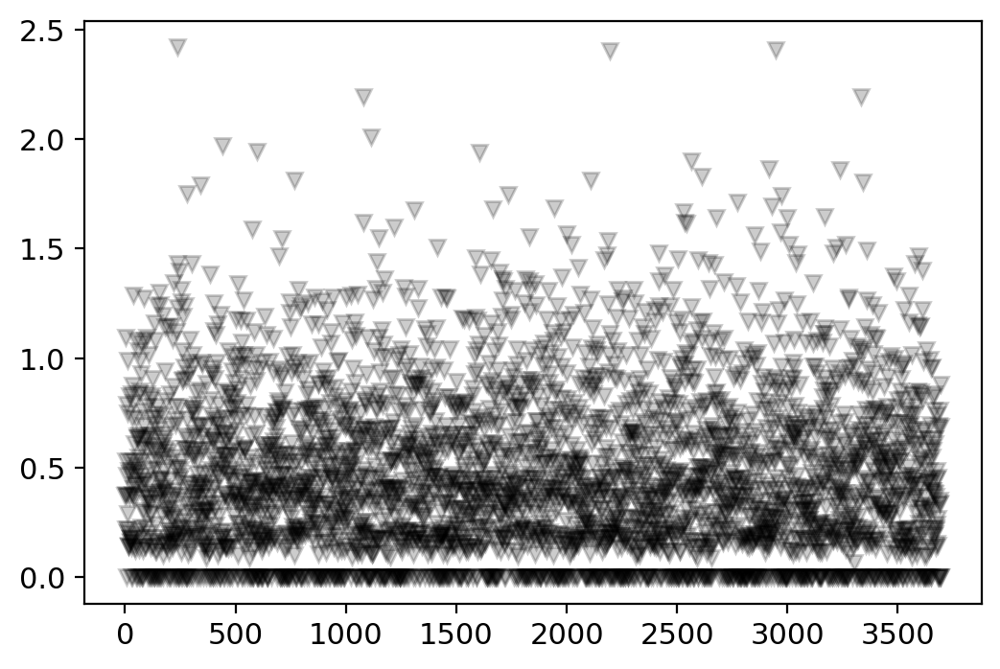

In [23]:
p2=plt.plot(gene1_20, 'v', color='black', alpha=0.2)

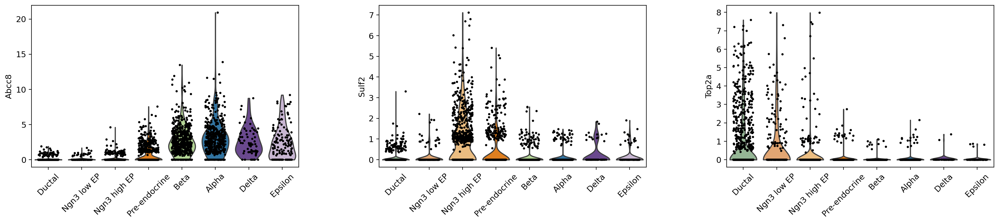

In [24]:
sc.pl.violin(adata1, ['Abcc8','Sulf2','Top2a'],size=3,layer='spliced',
             jitter=.3, groupby = 'clusters', rotation= 45)

# 3.3

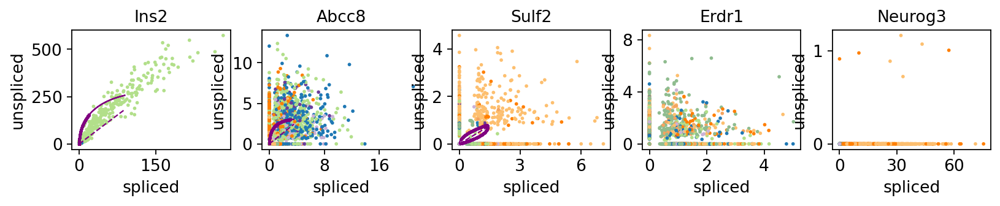

5  neighbours
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


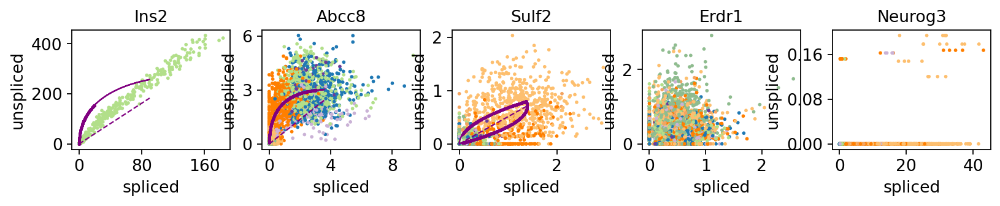

20  neighbours
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


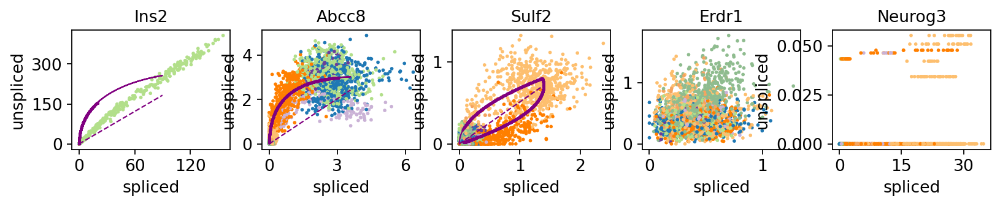

30  neighbours
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


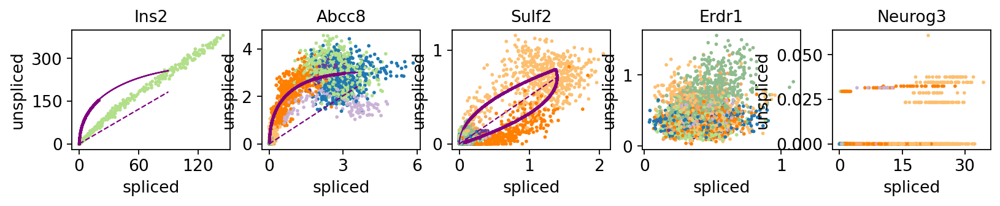

50  neighbours
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


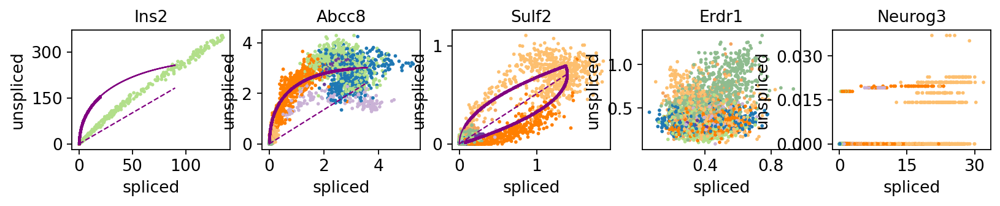

100  neighbours
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


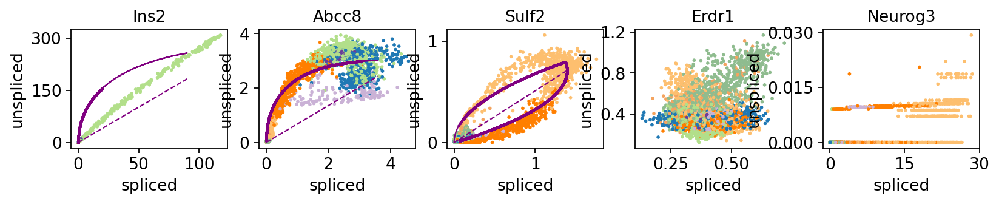

500  neighbours
computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


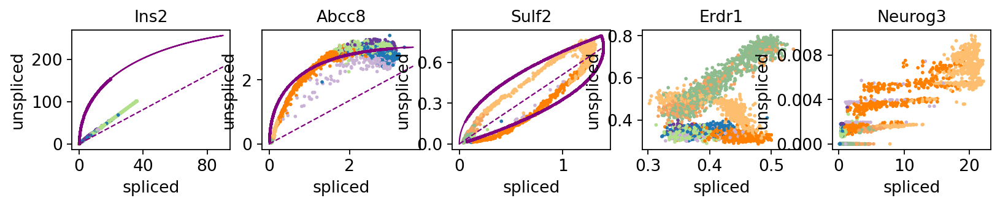

In [188]:
#Phase portaits of marker genes and comparison for more different numbers of neighbors using logarithmized counts

k=[5,20,30,50,100,500]

scv.pl.scatter(adata1, basis=["Ins2", "Abcc8", "Sulf2", "Erdr1", "Neurog3"], use_raw=True)
for i in k: 
    print( i," neighbours")
    scv.pp.moments(adata1, n_neighbors=i)
    scv.pl.scatter(adata1, basis=['Ins2', "Abcc8", "Sulf2", "Erdr1", "Neurog3"], use_raw=False)

In [78]:
scv.tl.velocity(adata1)
scv.tl.velocity_graph(adata1)

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:01:48) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


# Milestone 4: Velocity estimation

### 4.1. 
For velocity estimation, per default the stochastic model is applied. It estimates the steady-state ratio for each gene, and computes velocities as the residuals of the observations from this steady-state line.

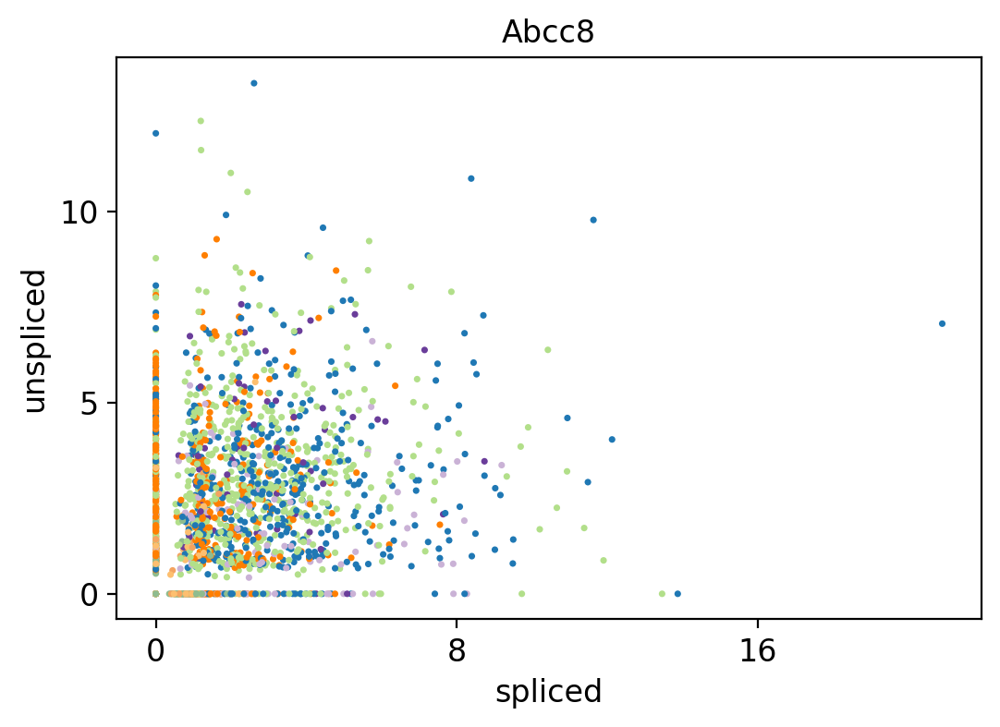

5  neighbours
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


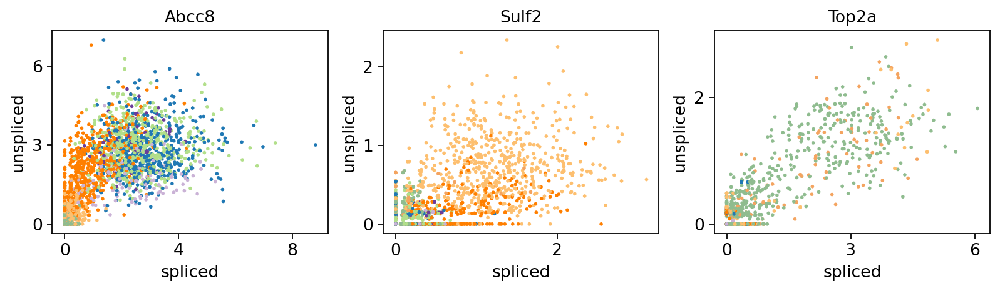

20  neighbours
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


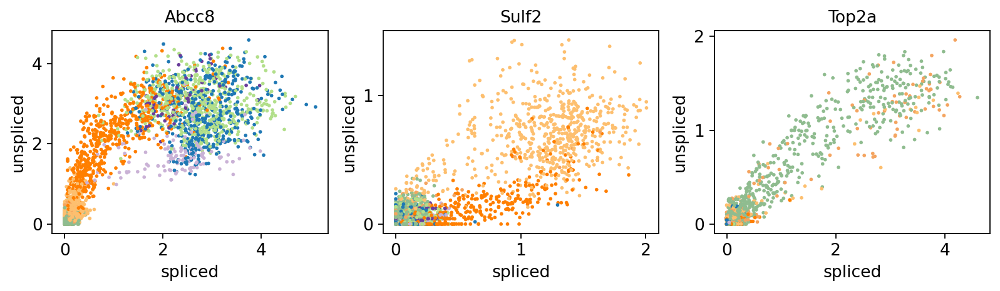

50  neighbours
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


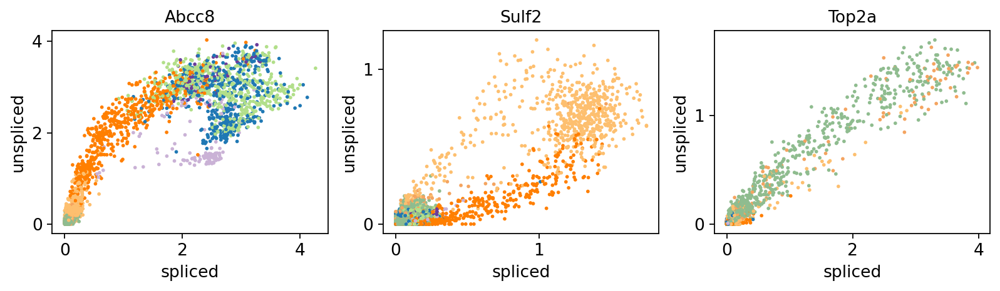

100  neighbours
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


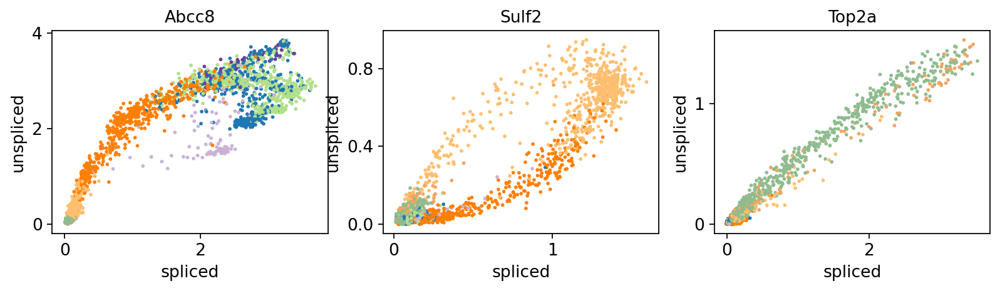

In [77]:
#Phase portaits of marker genes and comparison for more different numbers of neighbors using raw counts

k=[5,20,50,100]

scv.pl.scatter(adata, basis='Abcc8', use_raw=True)
for i in k: 
    print( i," neighbours")
    scv.pp.moments(adata, n_neighbors=i)
    scv.pl.scatter(adata, basis=['Abcc8', 'Sulf2','Top2a'], use_raw=False)

### 4.2. Demonstrate for a few genes, how the steady-state line is fit. Can you show mathematically why velocities are given as the residuals from this line?



In [ ]:
scv.pl.scatter(adata1, 'Adk', color=['clusters', 'velocity'])

In [ ]:
scv.pl.scatter(adata1, 'Abcc8', color=['clusters', 'velocity'])

 Mathematical equations for single gene that describe how the expected number of unspliced mRNA molecules u and the spliced molecules s evolve over time: 

$\frac{du}{dt} = a(t)- β(t)u(t)$

$\frac{ds}{dt} = β(t)u(t) - γ(t)s(t) $

If we assume that: 

$a(t)=a$
$γ(t)= γ$
$b(t)= 1$

the resulting equations are: 

$\frac{du}{dt} = a- u(t)$

$\frac{ds}{dt} = u(t) - γ s(t) $

where u(t) is the observed amount of unspliced counts and γ s(t) is the steady state ratio. Therefore velocity is the residual of u(t) and the steady state line. 




### 4.3. Now, apply the dynamical model instead and show how the steady-state lines differ.


In [29]:
scv.pp.moments(adata1, n_neighbors =50)
scv.tl.recover_dynamics(adata1,n_jobs=10)

computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 10/64 cores)


  0%|          | 0/498 [00:00<?, ?gene/s]

    finished (0:06:14) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [30]:
scv.tl.velocity(adata1, mode="dynamical")

computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [31]:
scv.tl.velocity_graph(adata1)

computing velocity graph (using 1/64 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:53) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


### 4.4. Now use a few gene phase portraits to demonstrate how inferred up- and down-regulation can be read from these portraits.


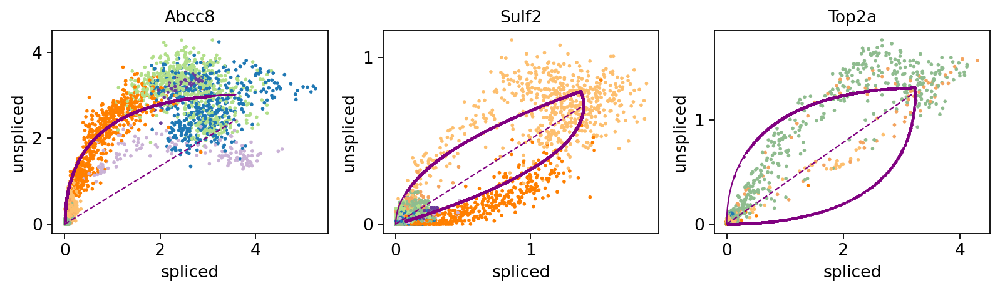

In [32]:
scv.pl.scatter(adata1, basis=['Abcc8','Sulf2','Top2a'],color='clusters', use_raw=False)

### 4.5. What are transient states as opposed to steady states? How many steady states exist?

Transient states are the ones that we have downregulation or upregulation, while steady states are the ones where the ratio is 1. We have 2 steady states the on and the off.


# Milestone 5: Embeddings

### 5.1. 
Compute various dimensionality reduction methods / embeddings (e.g., tsne, umap, diffmap) and show how they differ and what type of topology they capture (local vs. global similarity).

### 5.2. 
As you vary the main parameters (e.g., min_dist in umap), how does that impact the embedding?

### 5.3.
Which of these embeddings would you use for visualising trajectories and why?

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


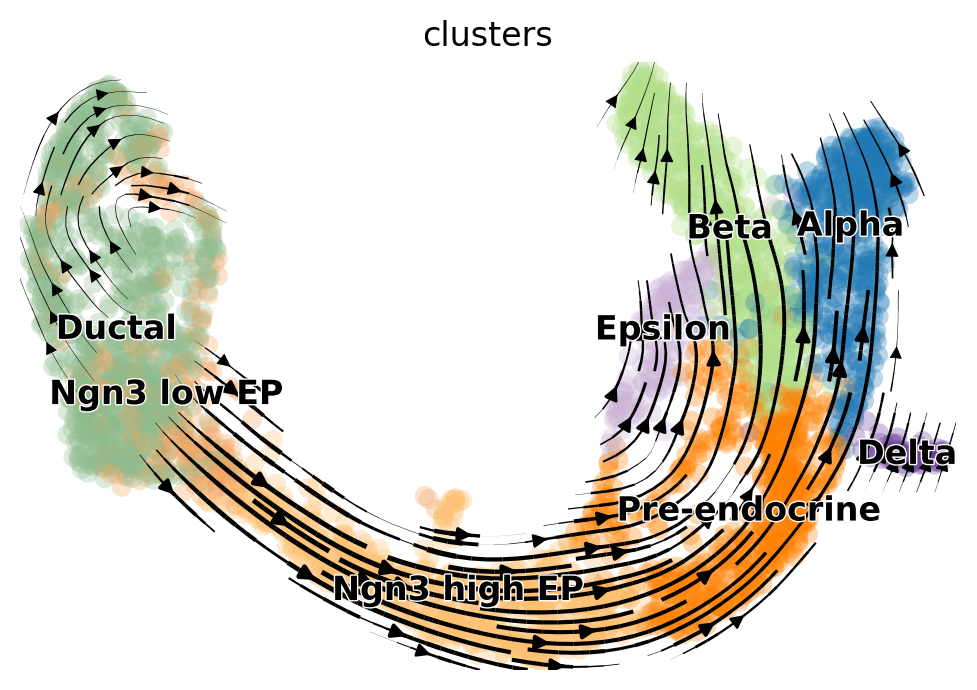

In [33]:
scv.pl.velocity_embedding_stream(adata1, basis='umap')

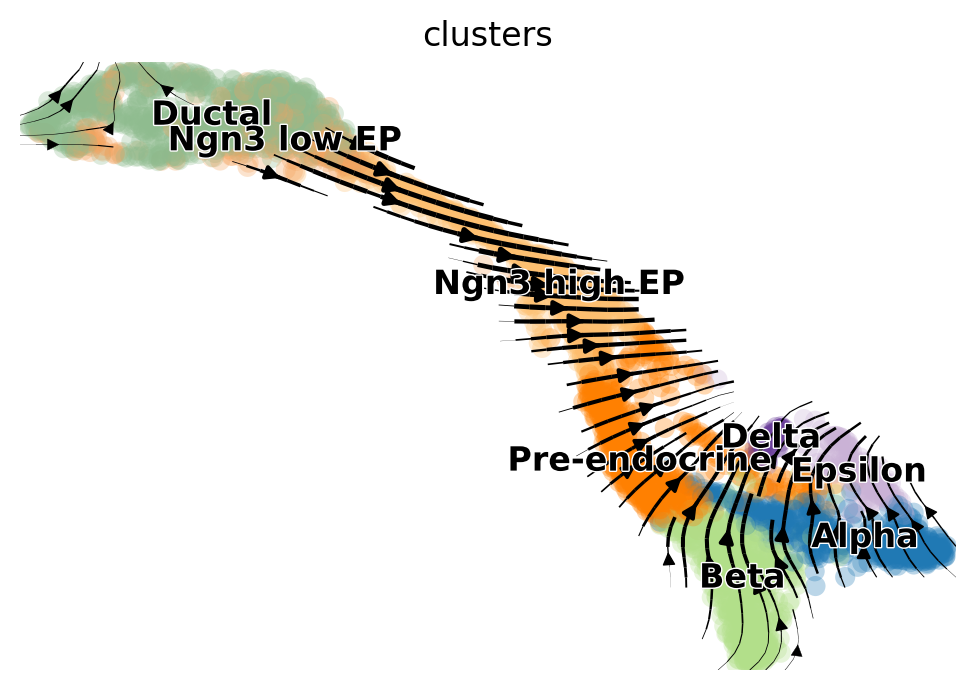

In [34]:
#umap embedding, min_dist=0.3
scv.tl.umap(adata1, min_dist=0.3)
scv.pl.velocity_embedding_stream(adata1, basis='umap')

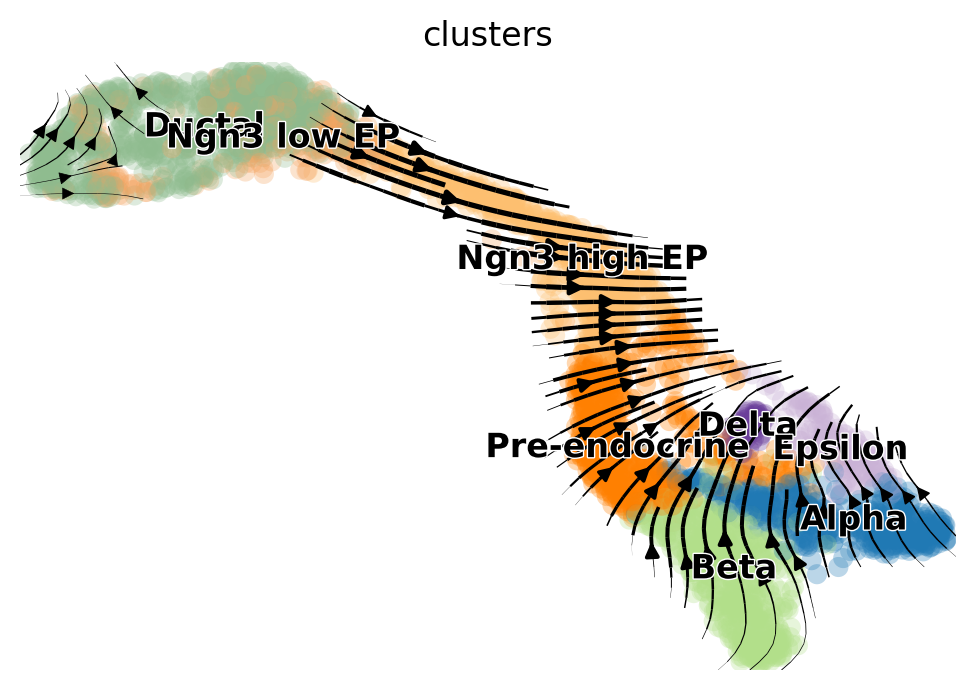

In [35]:
#umap embedding, min_dist=0.5
scv.tl.umap(adata1, min_dist=0.5)
scv.pl.velocity_embedding_stream(adata1, basis='umap')

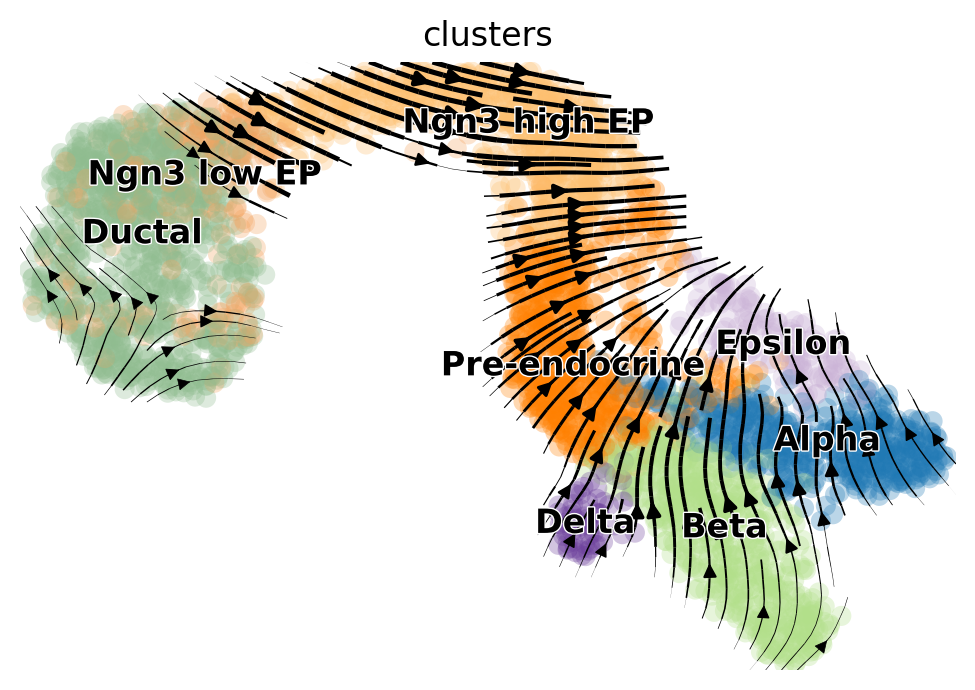

In [36]:
#umap embedding, min_dist=1
scv.tl.umap(adata1, min_dist=1)
scv.pl.velocity_embedding_stream(adata1, basis='umap')

In [37]:
#tsne embedding
scv.tl.tsne(adata1)

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_tsne', embedded velocity vectors (adata.obsm)


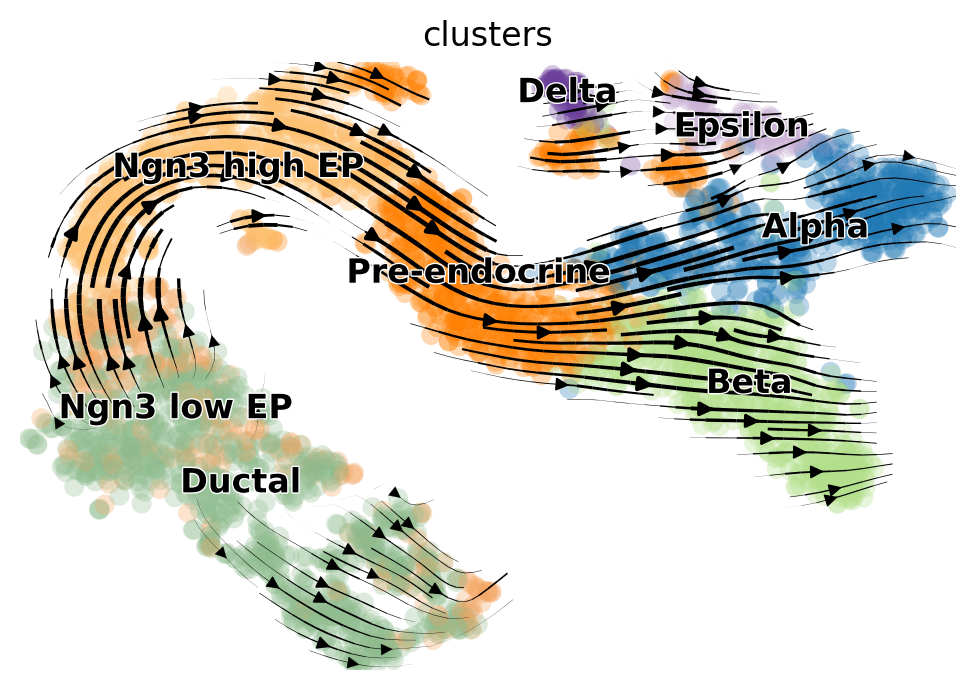

In [38]:
scv.pl.velocity_embedding_stream(adata1, basis='tsne')

computing velocity embedding
    finished (0:00:47) --> added
    'velocity_diffmap', embedded velocity vectors (adata.obsm)


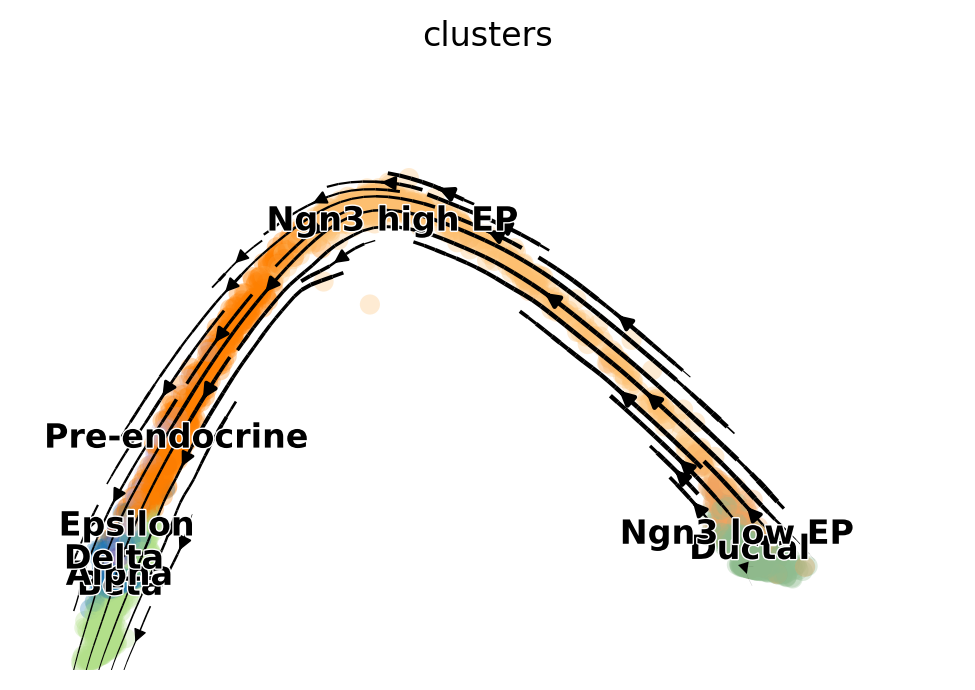

In [39]:
#diffusion map embedding
scv.tl.diffmap(adata1)
scv.pl.velocity_embedding_stream(adata1, basis='diffmap')

Tsne and umap look very similar, while diffusion map differs. In order to decide which graph (umap or tsne) to use we should know more about our data. As for the minimum distance 0.3 seems to give the best represtation. 

0.1  min_dist


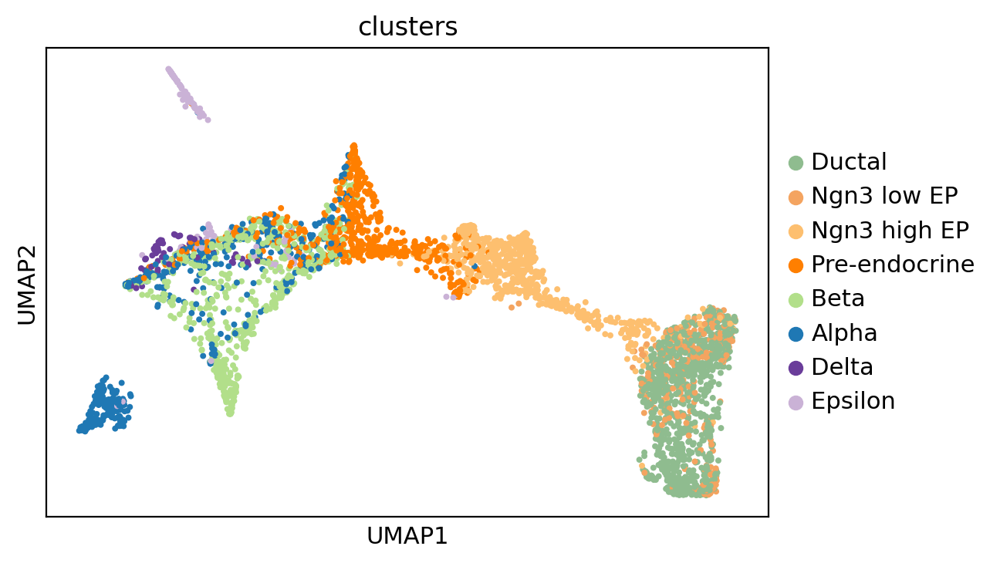

computing velocity embedding


KeyError: 'velocity'

In [ ]:
# function for ummin_dist umap - default 0.5
k=[0.1,0.5,1,2,3]

for i in k: 
    print( i," min_dist")
    sc.tl.umap(adata, min_dist = i)
    sc.pl.umap(adata, color= "clusters")
    scv.tl.velocity_embedding(adata, basis = "umap")
    scv.pl.velocity_embedding_stream(adata, basis= "umap")
    x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=1, random_state= 20)
    ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
    ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)
    x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=3, random_state= 20)
    ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
    ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

# Milestone 6

## Velocity graph

6.1. The velocity graph summarises all cell-to-cell transitions inferred from velocity. What exactly does the ij-th entry in the graph represent?

6.2. Can you run a number of cell transitions using the graph to simulate a trajectory starting from a particular cell in one of the embeddings?

6.3. How do the trajectories compare, when run from different starting cells (e.g., cell cycle vs. differentiation)?

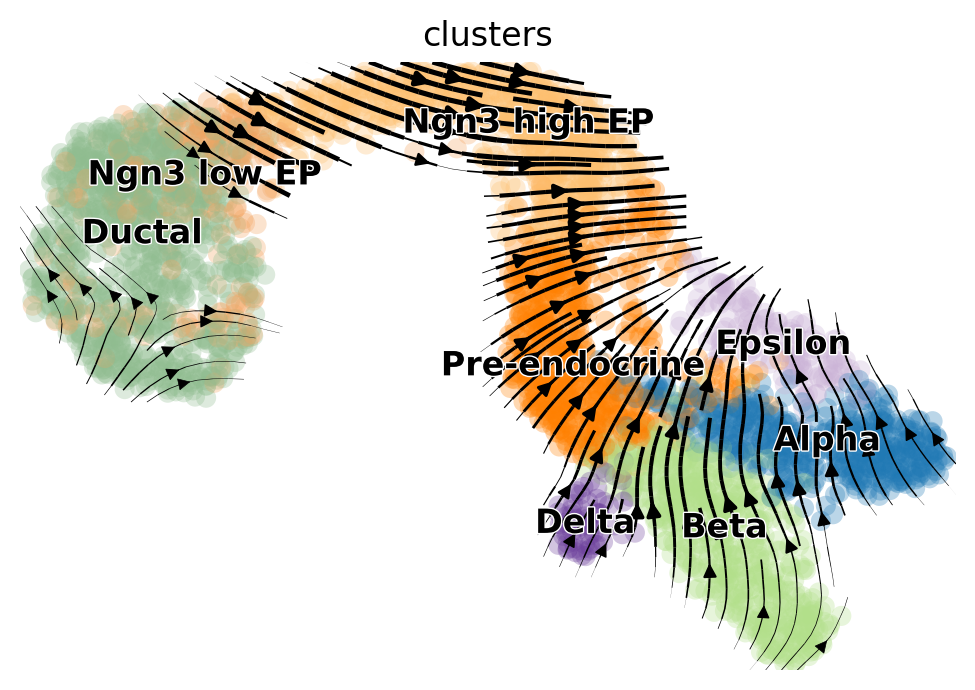

In [40]:
scv.pl.velocity_embedding_stream(adata1, basis='umap')

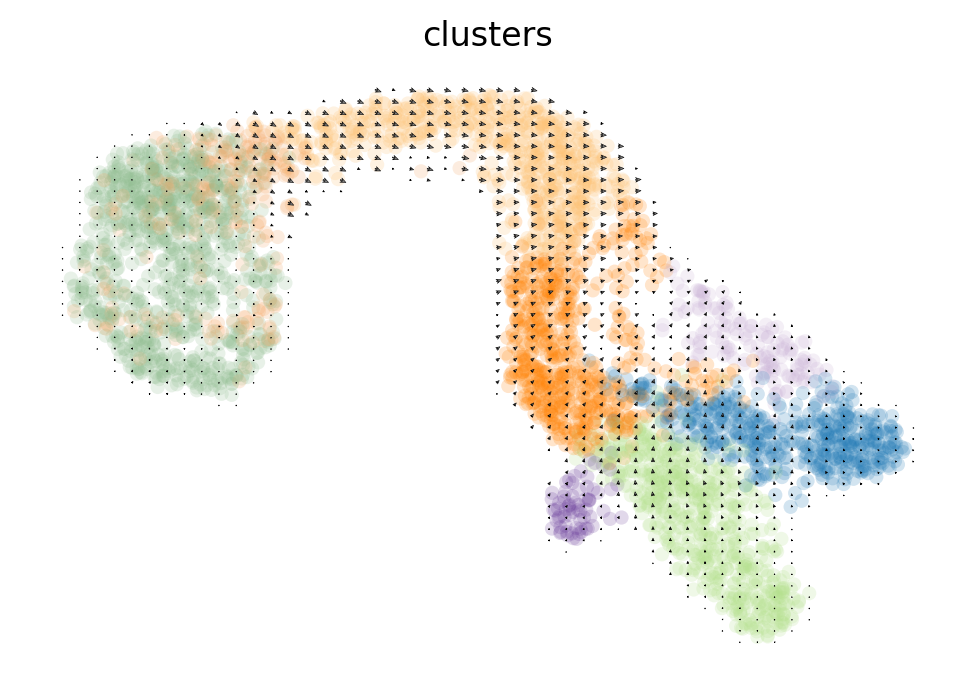

In [41]:
scv.pl.velocity_embedding_grid(adata1, basis='umap')

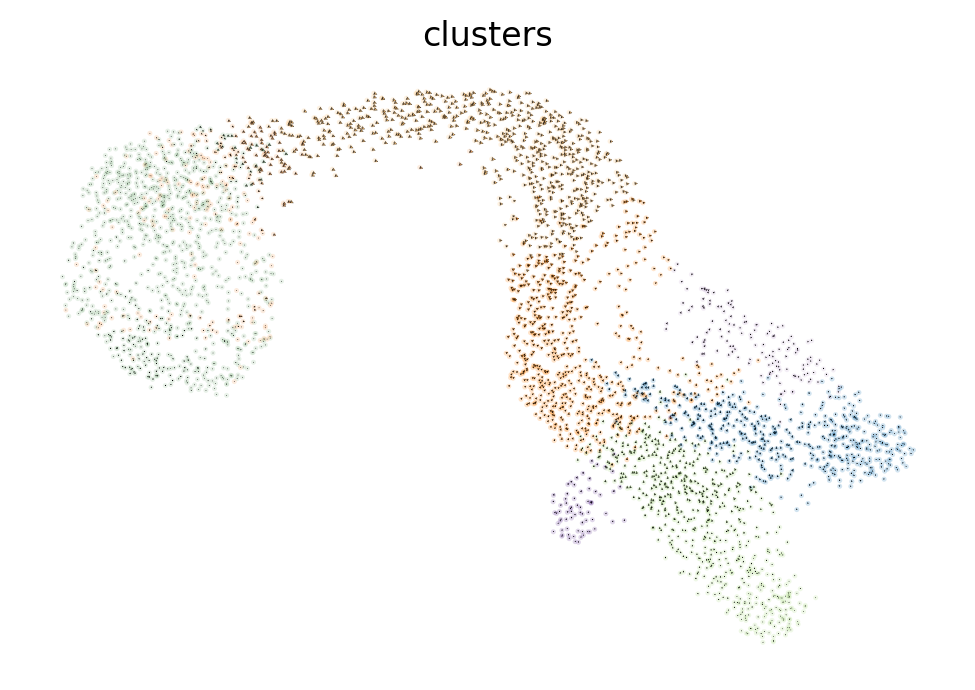

In [42]:
scv.pl.velocity_embedding(adata1, basis='umap')

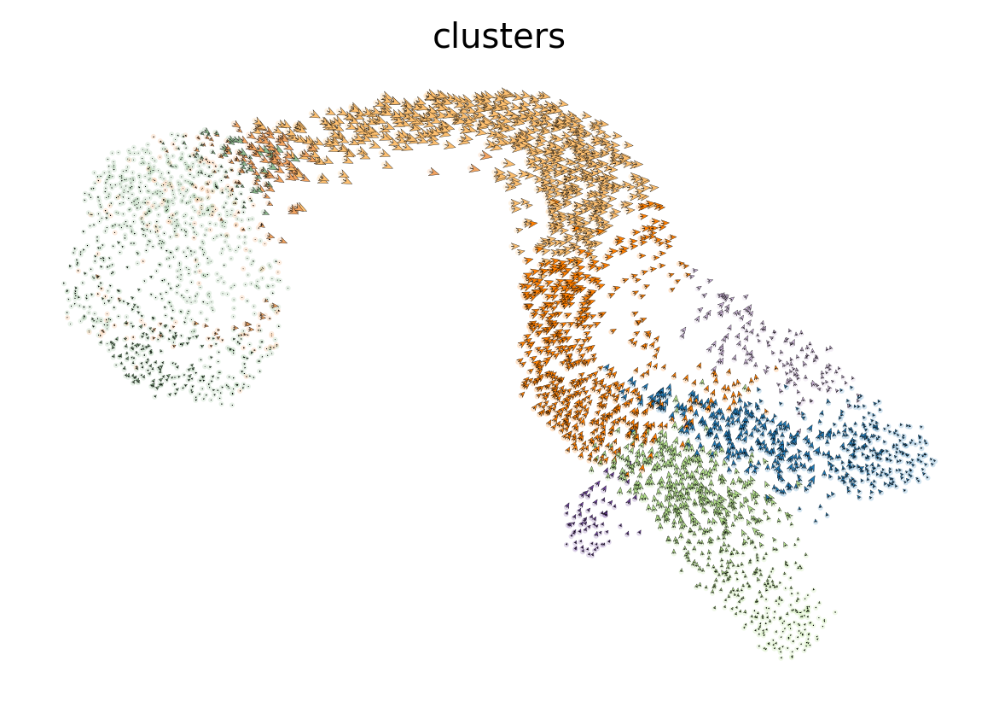

In [43]:
scv.pl.velocity_embedding(adata1, arrow_length=3, arrow_size=2, dpi=120)


The velocity graph matrix shows the probability of a cell transitioning to another cell. 

In [44]:
p1=scv.utils.get_transition_matrix(adata1)

In [45]:
print(p1)

  (0, 3694)	0.003956515
  (0, 3691)	4.8350046e-10
  (0, 3690)	2.29939e-08
  (0, 3689)	0.00069361425
  (0, 3683)	0.0018505035
  (0, 3681)	0.0010448896
  (0, 3678)	0.00020939513
  (0, 3674)	1.1785429e-09
  (0, 3673)	2.0243073e-05
  (0, 3669)	0.000121210054
  (0, 3666)	8.8233166e-05
  (0, 3662)	0.0014763008
  (0, 3660)	1.897474e-05
  (0, 3659)	6.685422e-09
  (0, 3654)	8.9707254e-07
  (0, 3652)	1.1305239e-09
  (0, 3651)	6.085657e-07
  (0, 3649)	3.7831367e-06
  (0, 3646)	0.0034482426
  (0, 3645)	5.0100274e-10
  (0, 3643)	0.0025152005
  (0, 3641)	0.00015293539
  (0, 3639)	1.9943567e-08
  (0, 3635)	2.9776315e-10
  (0, 3633)	1.6730946e-09
  :	:
  (3695, 47)	0.0015826621
  (3695, 45)	0.0004065605
  (3695, 44)	0.00084395666
  (3695, 42)	0.00046301703
  (3695, 39)	6.3903986e-05
  (3695, 38)	0.0006909219
  (3695, 37)	7.264598e-05
  (3695, 34)	1.1330323e-05
  (3695, 33)	5.9564896e-05
  (3695, 32)	0.00012502201
  (3695, 27)	0.00056783424
  (3695, 26)	0.0005208457
  (3695, 25)	0.0001070653
  (3695, 2

In [46]:
#terminal states of cells 
scv.tl.terminal_states(adata1)

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:01:38) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


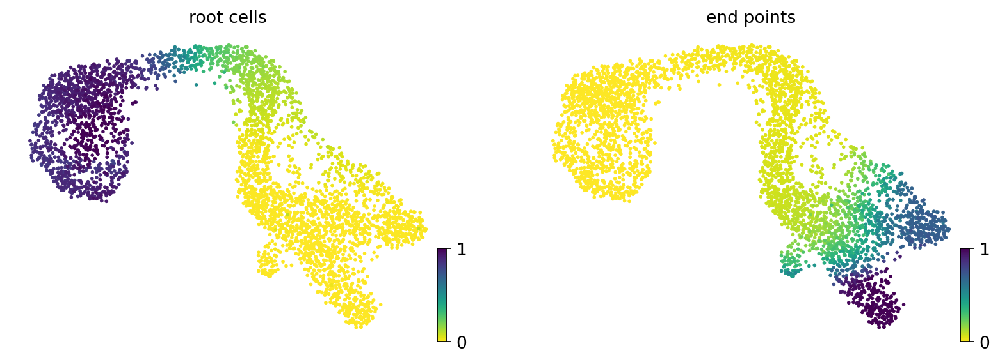

In [47]:
scv.pl.scatter(adata1, color=['root_cells', 'end_points'])

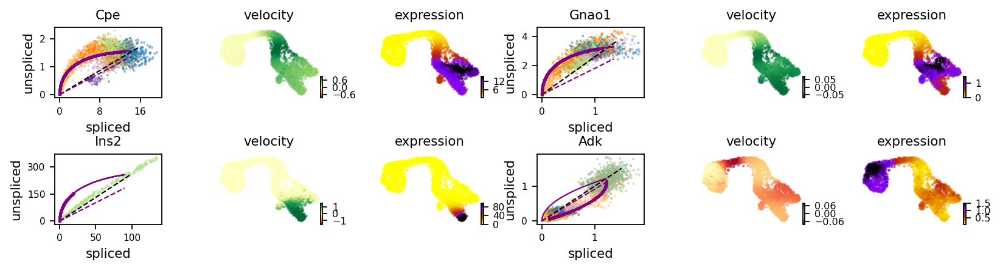

In [48]:
#Phase portraits of marker genes
scv.pl.velocity(adata1, ['Cpe',  'Gnao1', 'Ins2', 'Adk'], ncols=2)

In [49]:
adata1.uns['velocity_graph'].A

array([[0.        , 0.        , 0.6556269 , ..., 0.        , 0.83437693,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.7098341 ,
        0.        ],
       ...,
       [0.        , 0.0771533 , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.17686728,
        0.        ]], dtype=float32)

In [50]:
adata1.uns['velocity_graph_neg'].A

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.09844134,
         0.        ,  0.        ],
       [-0.56666905,  0.        ,  0.        , ...,  0.        ,
         0.        , -0.11178571],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.4644535 ,  0.        , -0.479623  , ...,  0.        ,
         0.        , -0.18430515],
       [-0.1543251 ,  0.        , -0.07797139, ...,  0.        ,
         0.        ,  0.        ]], dtype=float32)

In [51]:
adata1.obs

,clusters_coarse,clusters,S_score,G2M_score,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition,root_cells,end_points
index,,,,,,,,,,,
AAACCTGAGAGGGATA,Pre-endocrine,Pre-endocrine,-0.224902,-0.252071,4954.0,1575.0,4954.0,5410.060059,0.069354,0.006431,0.098844
AAACCTGAGCCTTGAT,Ductal,Ductal,-0.014707,-0.232610,7071.0,978.0,7071.0,5476.578125,0.800759,0.911018,0.000697
AAACCTGAGGCAATTA,Endocrine,Alpha,-0.171255,-0.286834,4070.0,1095.0,4070.0,5436.109863,0.154454,0.004603,0.200136
AAACCTGCATCATCCC,Ductal,Ductal,0.599244,0.191243,8362.0,1655.0,8362.0,5505.859863,0.699531,0.889302,0.001616
AAACCTGGTAAGTGGC,Ngn3 high EP,Ngn3 high EP,-0.179981,-0.126030,5026.0,1014.0,5026.0,5473.050781,0.020926,0.059276,0.041482
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGTGACATA,Pre-endocrine,Pre-endocrine,-0.235896,-0.266101,9219.0,2488.0,9219.0,5448.891602,0.158871,0.007620,0.070212
TTTGTCAAGTGTGGCA,Ngn3 high EP,Ngn3 high EP,0.279374,-0.204047,7298.0,943.0,7298.0,5568.489258,0.076361,0.154876,0.026581
TTTGTCAGTTGTTTGG,Ductal,Ductal,-0.045692,-0.208907,5234.0,789.0,5234.0,5585.724121,0.774096,0.958428,0.001051


In [52]:
#Velocity pseudotime for different cells
scv.tl.velocity_pseudotime(adata1,root_key='AAACCTGAGGCAATTA')

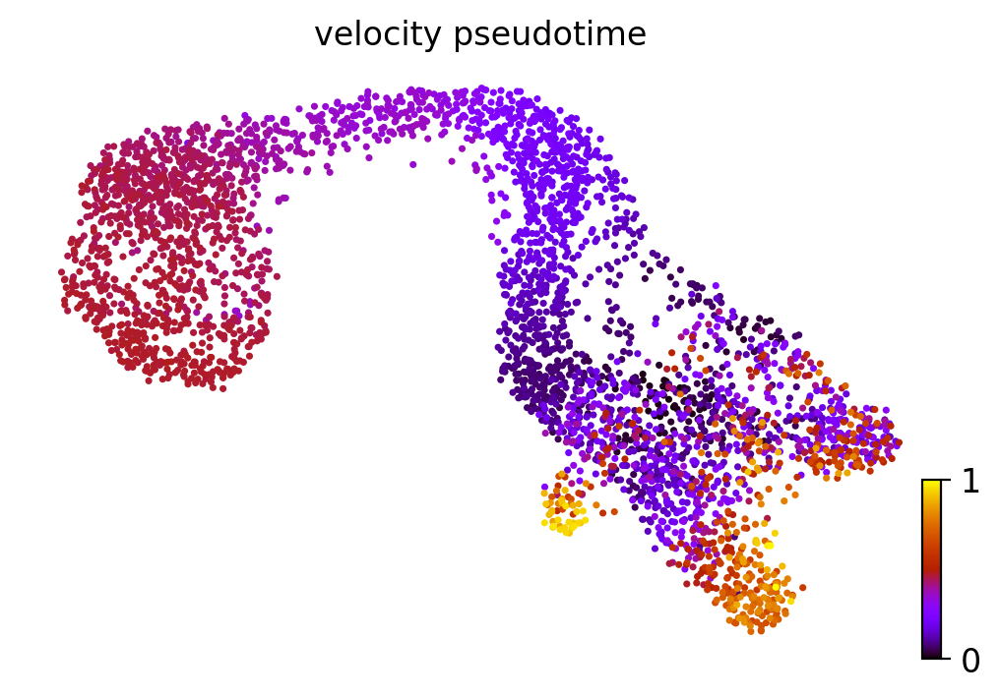

In [53]:
scv.pl.scatter(adata1, color='velocity_pseudotime', cmap='gnuplot')

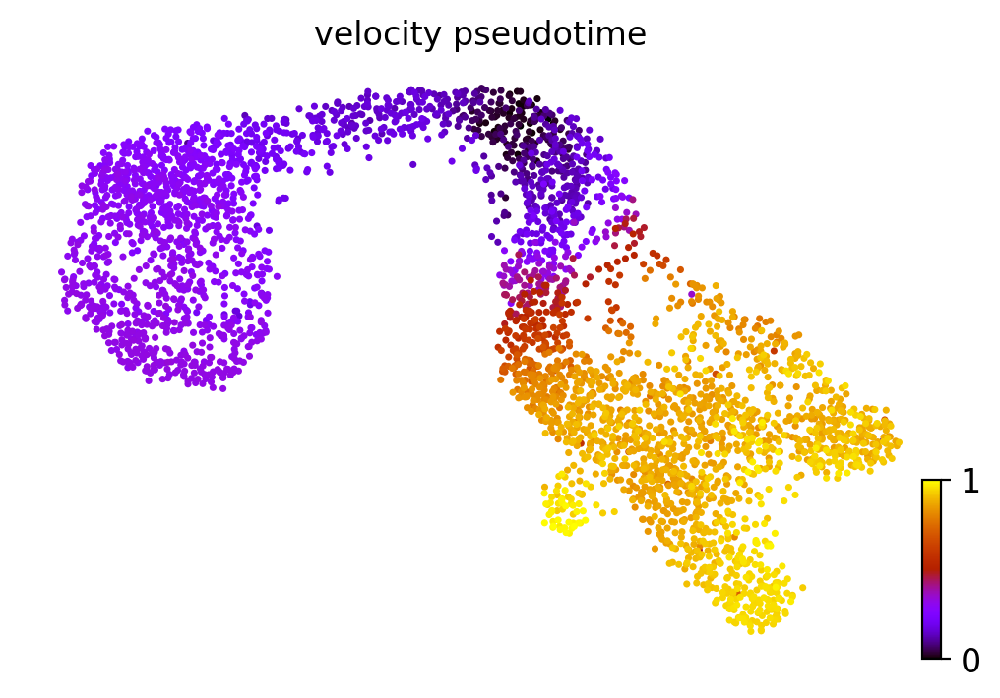

In [54]:
scv.tl.velocity_pseudotime(adata1,root_key='TTTGTCAAGTGTGGCA')
scv.pl.scatter(adata1, color='velocity_pseudotime', cmap='gnuplot')

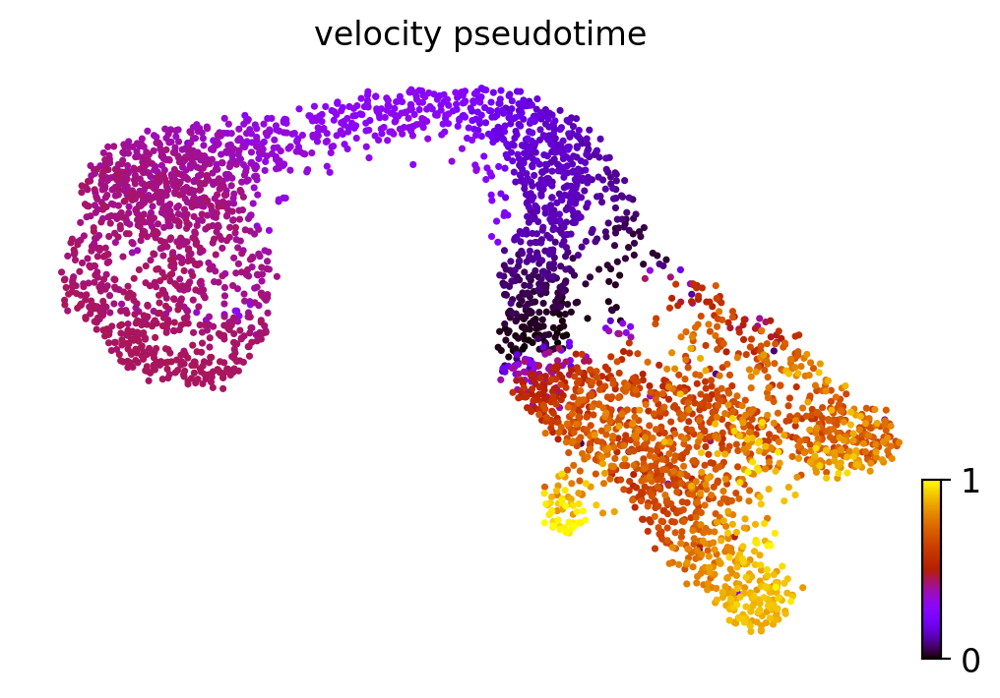

In [55]:
scv.tl.velocity_pseudotime(adata1,root_key='TTTGTCAAGTGACATA')
scv.pl.scatter(adata1, color='velocity_pseudotime', cmap='gnuplot')

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


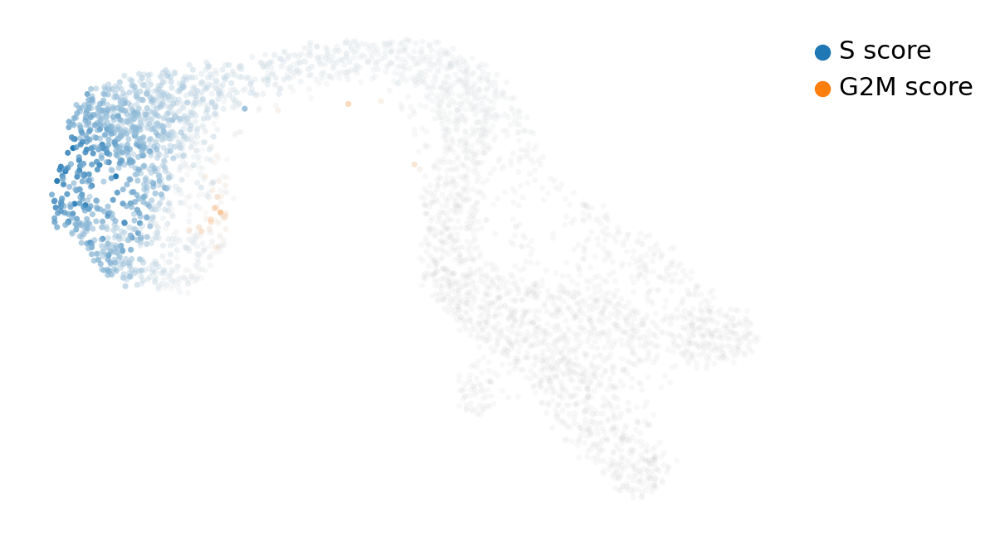

In [56]:
#Cell cycle score
scv.tl.score_genes_cell_cycle(adata1)
scv.pl.scatter(adata1, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

#### 6.3

When taking cells in the middle, we end up with trajectories to both directions, whereas when we take cells from extreme positions, we end up with trajectories directed only on one side. 

*Cells that are not on G2M phase of S phase based on the clusted might be on G1 phase, Mitosis or even not cycling since we don't have these annotations.


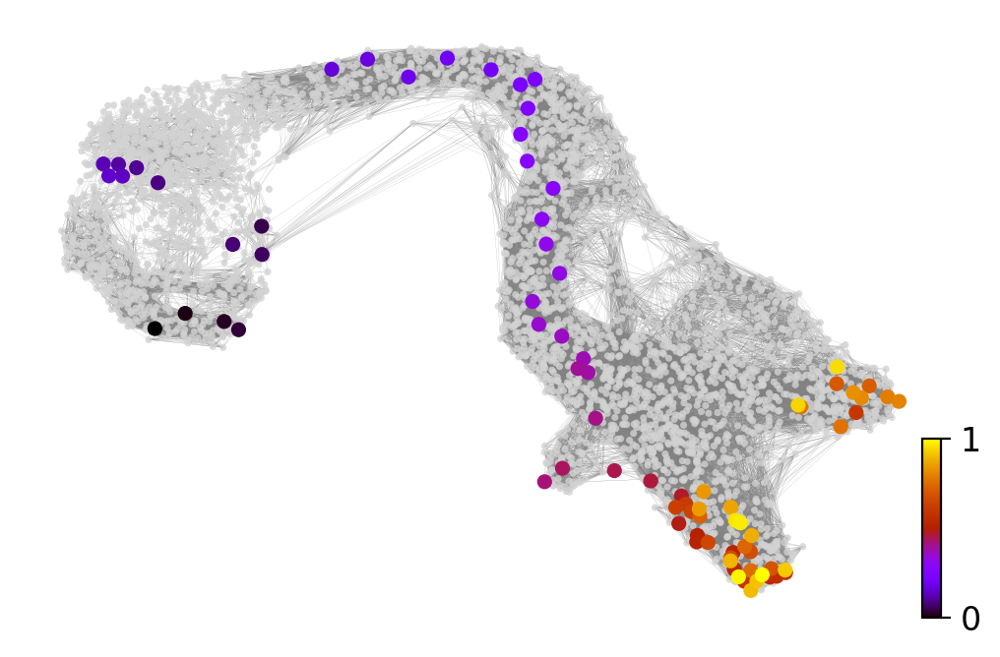

In [57]:
x, y = scv.utils.get_cell_transitions(adata1, basis='umap', starting_cell=1000, n_steps=100, perc=10)
ax = scv.pl.velocity_graph(adata1, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata1, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

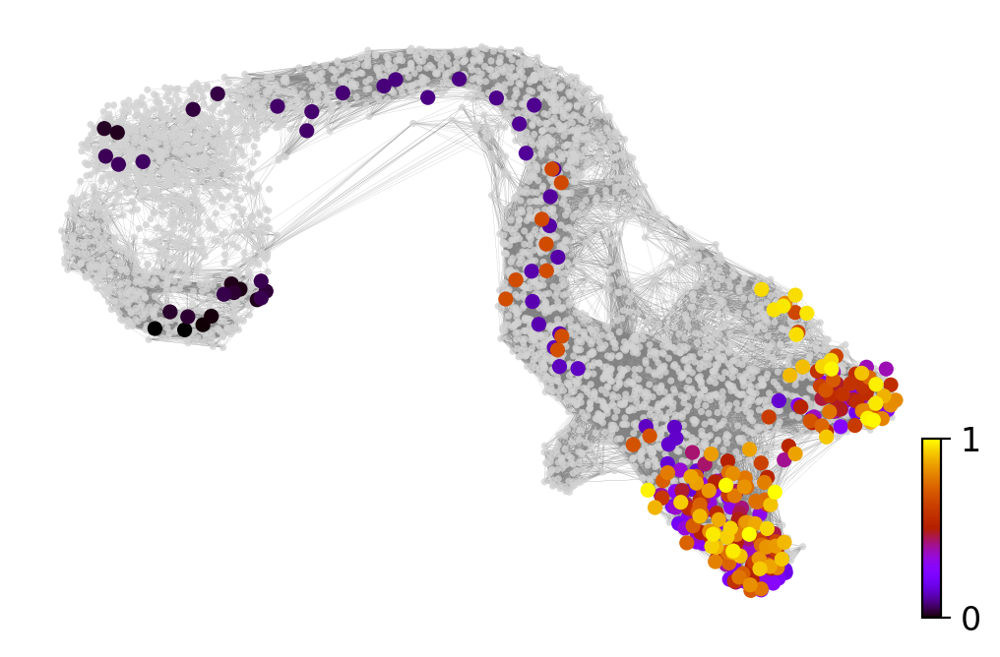

In [58]:
x, y = scv.utils.get_cell_transitions(adata1, basis='umap', starting_cell=1000, n_steps=1000, perc=10)
ax = scv.pl.velocity_graph(adata1, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata1, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

# Milestone 7 

## Velocity projection

7.1. Now the high-dimensional velocity vector field is visualized by projection into the two-dimensional embedding. Show how the velocity graph (transition matrix) is being used to project the data. For instance, you can pick one particular cell, and show its potential transitions, and how the actual arrow is derived from these.

7.2. Vary with the n_neighbors parameter and show how that impacts the projected vector field.

7.3. Why is the vector field getting smoother/averaged with a large n_neighbors parameter?



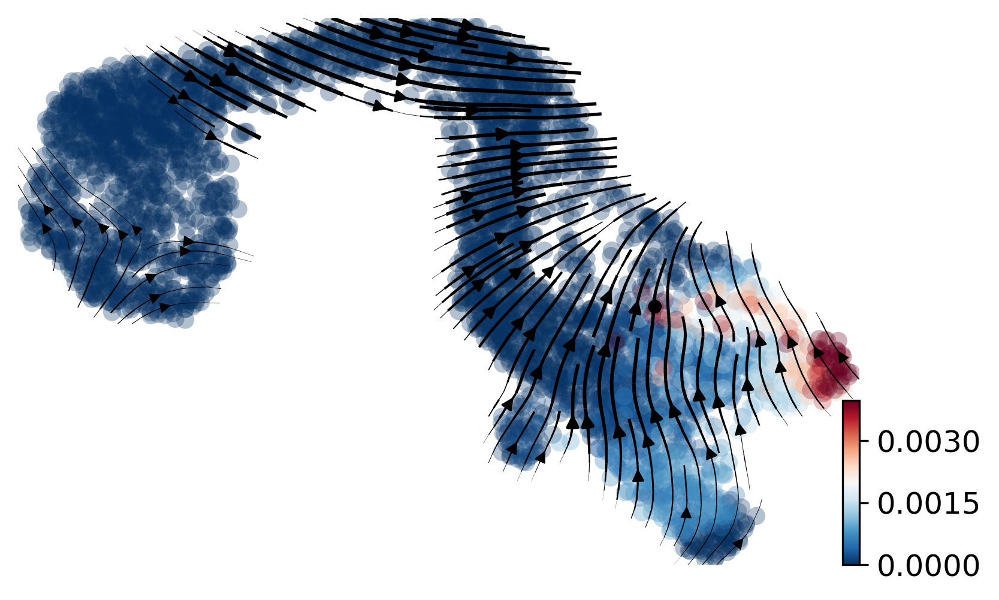

In [59]:
startingCell=100
trans = scv.utils.get_transition_matrix(adata1)[startingCell,:]
x, y = scv.utils.get_cell_transitions(adata1, basis='umap', starting_cell=startingCell)
ax = scv.pl.velocity_embedding_stream(adata1, basis='umap',color=trans,perc=99,show=False,dpi=150)
ax = scv.pl.scatter(adata1, x=x[0], y=y[0], s=120, c='ascending', cmap='gnuplot', ax=ax, colorbar= False)

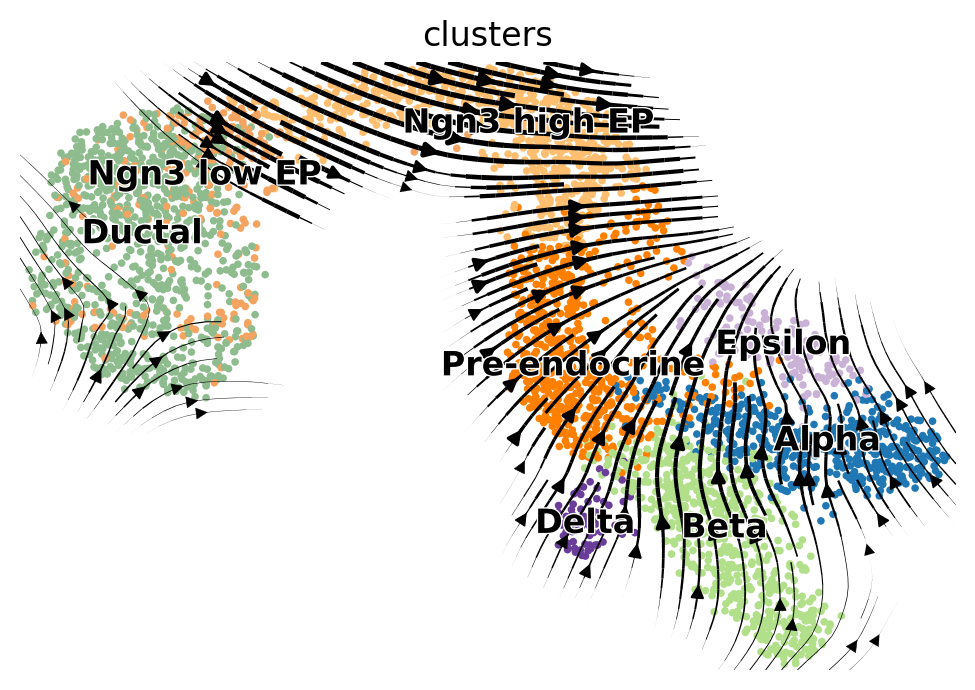

In [61]:
scv.pl.velocity_embedding_stream(adata1, basis='umap',size=30,alpha=1,n_neighbors=10, smooth= True )

# Milestone 8

## Topic 1 - Vector field representations depend on the embedding

8.1.1. Now show how the projected vector field is represented in the embedding as you vary some of the parameters from before (such as min_dist for UMAP).

8.1.2. Is there a specific parameter set, where the arrows and the embedding coordinates do not work together?

8.1.3. Which embedding provides the highest resolution into the vector field.

8.1.4. Using the simulated cellular transitions, can you show which embedding specification represent the high-dimensional vector field best?

8.1.5. Can you even systematically quantify, how well the vector field is represented in the embedding? Possible metrics could, e.g., be correlation of embedded velocities with pseudo time / latent time, 'compactness' of transitions, correlation of transitions in the embedding weighted by their probabilities.

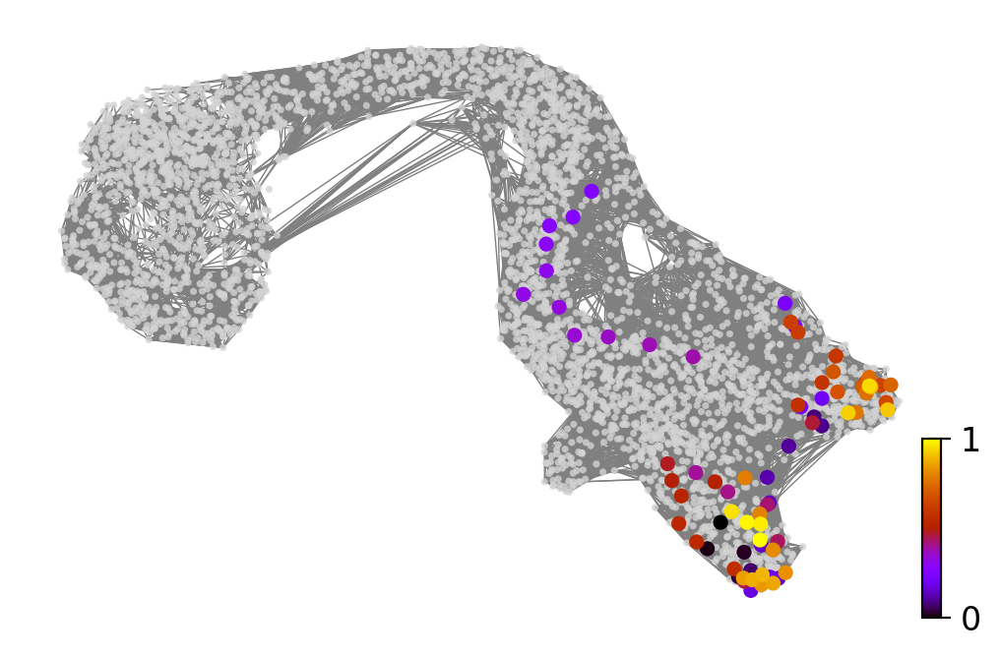

In [65]:
seed=120
root_cell_cc=np.flatnonzero(adata1.obs["clusters"]=="Beta") [1]

x,y= scv.utils.get_cell_transitions(adata1, basis="umap", starting_cell=root_cell_cc, random_state=seed)
ax=scv.pl.velocity_graph(adata1, c="lightgrey", edge_width=0.5, show=False)
ax=scv.pl.scatter(adata1, x=x, y=y, s=120, c="ascending", cmap="gnuplot", ax=ax)

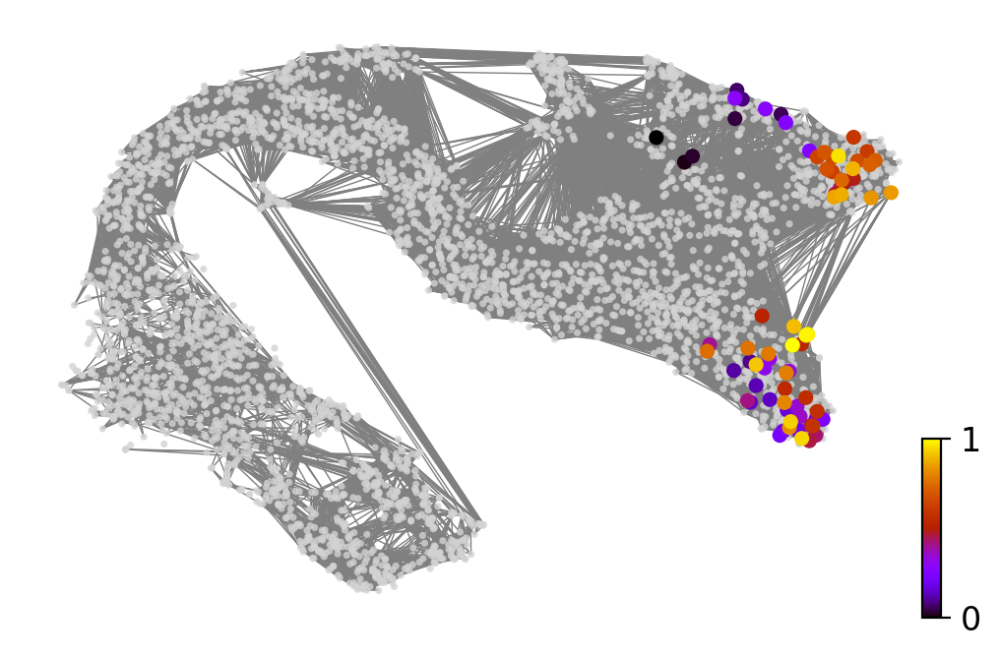

In [66]:
seed=120
root_cell_cc=np.flatnonzero(adata1.obs["clusters"]=="Beta") [1]

x,y= scv.utils.get_cell_transitions(adata1, basis="tsne", starting_cell=100)
ax=scv.pl.velocity_graph(adata1, c="lightgrey",basis= "tsne", edge_width=0.5, show=False)
ax=scv.pl.scatter(adata1, x=x, y=y, s=120, c="ascending", cmap="gnuplot", ax=ax)

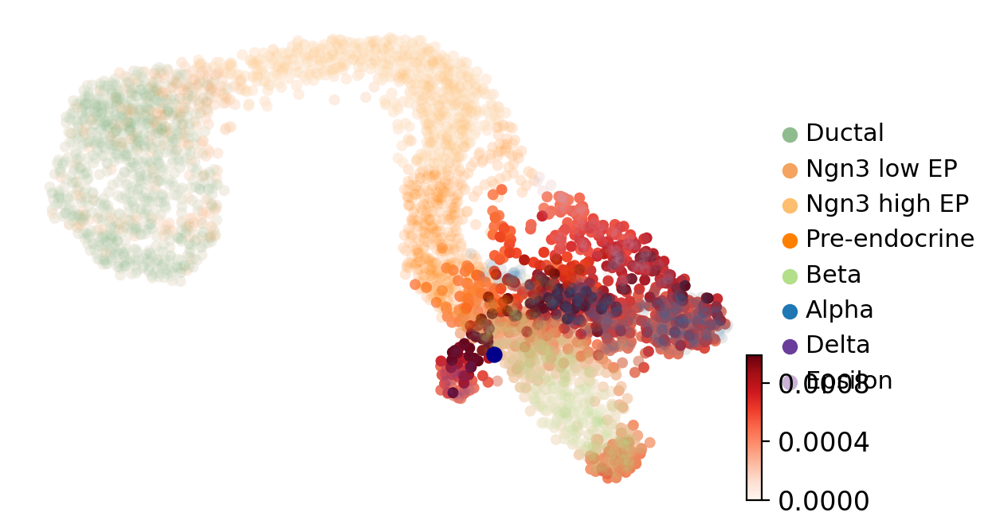

In [96]:
#Transition probabilities of ductal cells 
cluster = 'Delta'
selected_cell = np.flatnonzero(adata1.obs['clusters'] == cluster)[0]
trans = scv.utils.get_transition_matrix(adata1).todense()

ax = scv.pl.scatter(adata1[adata1.obs['clusters'] == cluster], color=selected_cell, show=False, alpha=0, size=20)
ax = scv.pl.scatter(adata1, color=trans[:,selected_cell], show=False, cmap='Reds', alpha=1, perc=99, ax=ax, size=100)
ax = scv.pl.scatter(adata1, color='clusters', alpha=0.1, ax=ax, size=100, legend_loc='right margin', title='', show=False)

In [101]:
# Quantification for different values of parameters and different embeddings
# UMAP
min_dist = 0.5
spread = 1
seed = 55
scv.tl.umap(adata,min_dist=min_dist,spread=spread,random_state=seed)
adata.obsm['X_umap'][:, 0] = adata.obsm['X_umap'][:, 0] / np.max(np.abs(adata.obsm['X_umap'][:, 0]))
adata.obsm['X_umap'][:, 1] = adata.obsm['X_umap'][:, 1] / np.max(np.abs(adata.obsm['X_umap'][:, 1]))
seed = 55
d = []
for cell in list(range(0,len(adata.obs))):
    x = scv.utils.get_cell_transitions(adata,n_steps=100, starting_cell=cell,random_state=seed)
    c=[]
    for i in range(1,len(x)):
        delta_x = [adata.obsm['X_umap'][x[i],0] - adata.obsm['X_umap'][x[i-1],0]]
        delta_y = [adata.obsm['X_umap'][x[i],1] - adata.obsm['X_umap'][x[i-1],1]]
        c += [np.sqrt(np.square(delta_x)+np.square(delta_y))]
    #print(np.mean(c))
    d += [np.mean(c)]
name = 'MTL_UMAPmd'+str(min_dist)+'spr'+str(spread)
adata.obs[name] = d
print(np.mean(d)) ,name, scv.pl.scatter(adata,color=name,color_map='gnuplot',title='Mean Transition Length') , scv.pl.scatter(adata,color='clusters',color_map='gnuplot')

In [101]:
#Replot UMAP
min_dist = 0.5
spread = 1
seed = 55
scv.tl.umap(adata,min_dist=min_dist,spread=spread,random_state=seed)
name = 'MTL_UMAPmd'+str(min_dist)+'spr'+str(spread)
print(np.mean(adata.obs[name])) ,name, scv.pl.scatter(adata,color=name,color_map='gnuplot',title='Mean Transition Length',basis='umap') , scv.pl.scatter(adata,color='clusters',color_map='gnuplot',basis='umap')

In [101]:
#Tsne

perplexity = 30
seed = 55
scv.tl.tsne(adata,perplexity=perplexity,n_jobs=12,random_state=seed)
adata.obsm['X_tsne'][:, 0] = adata.obsm['X_tsne'][:, 0] / np.max(np.abs(adata.obsm['X_tsne'][:, 0]))
adata.obsm['X_tsne'][:, 1] = adata.obsm['X_tsne'][:, 1] / np.max(np.abs(adata.obsm['X_tsne'][:, 1]))
d = []
for cell in list(range(0,len(adata.obs))):
    x = scv.utils.get_cell_transitions(adata,n_steps=100, starting_cell=cell,random_state=seed)
    c=[]
    for i in range(1,len(x)):
        delta_x = [adata.obsm['X_tsne'][x[i],0] - adata.obsm['X_tsne'][x[i-1],0]]
        delta_y = [adata.obsm['X_tsne'][x[i],1] - adata.obsm['X_tsne'][x[i-1],1]]
        c += [np.sqrt(np.square(delta_x)+np.square(delta_y))]
    #print(np.mean(c))
    d += [np.mean(c)]
name = 'MTL_tSNEperp'+str(perplexity)
adata.obs[name] = d
print(np.mean(d)) ,name, scv.pl.scatter(adata,color=name,color_map='gnuplot',title='Mean Transition Length') , scv.pl.scatter(adata,color='clusters',color_map='gnuplot')

In [101]:
#Replot tSNE
perplexity = 30
seed = 55
scv.tl.tsne(adata,perplexity=perplexity,n_jobs=12,random_state=seed)
name = 'MTL_tSNEperp'+str(perplexity)
print(np.mean(adata.obs[name])) ,name, scv.pl.scatter(adata,color=name,color_map='gnuplot',title='Mean Transition Length',basis='tsne') , scv.pl.scatter(adata,color='clusters',color_map='gnuplot',basis='tsne')

In [101]:
#Transition of o
scv.tl.tsne(adata)
scv.tl.umap(adata)
x = scv.utils.get_cell_transitions(adata,n_steps=100, starting_cell='TGAGCCGGTTCGGCAC',random_state=55)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False,basis='tsne')
varX = adata.obsm['X_tsne'][x,0]
varY = adata.obsm['X_tsne'][x,1]
ax = scv.pl.scatter(adata, x=varX, y=varY, s=120, c='ascending', cmap='gnuplot',ax=ax, show=False,basis='tsne')
ax = scv.pl.scatter(adata, x=varX[0], y=varY[0], s=500, c='ascending', color='pink', ax=ax,colorbar=False,basis='tsne',show=False)
varX = adata.obsm['X_umap'][x,0]
varY = adata.obsm['X_umap'][x,1]
bx = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False,basis='umap')
bx = scv.pl.scatter(adata, x=varX, y=varY, s=120, c='ascending', cmap='gnuplot',ax=bx, show=False,basis='umap')
bx = scv.pl.scatter(adata, x=varX[0], y=varY[0], s=500, c='ascending', color='pink', ax=bx,colorbar=False,basis='umap',show=False)

ax , bx

ValueError: You need to run `tl.velocity_graph` first to compute cosine correlations.